Local Outlier Projects
======================

This notebook explores the possibility of using local outlier detection on project descriptions to identify those that are outliers within their own topic group. The descriptions are vectorised using various methods, before local outlier detection is run. A quantitative assessment is carried out alongside a qualitative comparison of the outlying projects against their nearest neighbours.

Authors: George Richardson (george.richardson@nesta.org.uk)

### Preamble

In [1]:
%load_ext line_profiler
%load_ext autoreload
%autoreload 2

In [2]:
import os
import ast
import json
import itertools

import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

from collections import defaultdict, Counter
from datetime import datetime
from itertools import zip_longest
from matplotlib.ticker import NullFormatter

from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import ColumnDataSource, HoverTool

from analysis.src.data.readnwrite import get_data_dir
from analysis.src.data.data_utilities import flatten, eval_column, grouper

pd.options.display.max_columns = 99
output_notebook()

Loading BokehJS ...

In [3]:
%matplotlib inline

# Paths
# Get the top path
data_path = get_data_dir()

# Create the path for external data
ext_data = os.path.join(data_path, 'external')
# Raw data
raw_data = os.path.join(data_path, 'raw')
# And external data
proc_data = os.path.join(data_path, 'processed')
# And interim data
inter_data = os.path.join(data_path, 'interim')
# And figures
fig_path = os.path.join(data_path, 'figures')

# Get date for saving files
today = datetime.utcnow()

today_str = "_".join([str(x) for x in [today.year,today.month,today.day]])

## 1. Load Data

We are going to load both the GDB and the RWJF Pioneer and Global projects, and join them into a single dataframe.

In [360]:
gdb_df = pd.read_csv(os.path.join(raw_data, 'gdb.csv'))

/Users/grichardson/miniconda3/envs/rwjf/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2728: DtypeWarning: Columns (1,5,7,10,11,12,13,14,18,19,22) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [361]:
rwjf_df = pd.read_csv(os.path.join(inter_data, 'rwjf_pioneer_and_global_projects.csv'))

Now we need to join the other relevant data modules:

Dates for GDB:

In [362]:
gdb_dates_df = pd.read_csv(os.path.join(inter_data, 'gdb_dates.csv'))
gdb_df = pd.concat([gdb_df, gdb_dates_df], axis=1)

MeSH labels:

In [363]:
gdb_mesh_df = pd.read_csv(os.path.join(inter_data, 'gdb_mesh_labels.csv'))
rwjf_mesh_df = pd.read_csv(os.path.join(inter_data, 'rwjf_mesh_labels.csv'))

gdb_df = pd.concat([gdb_df, gdb_mesh_df], axis=1)
rwjf_df = pd.concat([rwjf_df, rwjf_mesh_df], axis=1)

We're going to remove projects from GitHub as they don't play nicely with MeSH terms, and Crunchbase as they're very short. There are also some projects with null descriptions.

In [364]:
gdb_df = gdb_df[gdb_df['source_id'] != 'GitHub']
gdb_df = gdb_df[gdb_df['source_id'] != 'Crunchbase']
gdb_df['description'][pd.isnull(gdb_df['description'])] = ''

Let's concatenate the two sets of projects and extract their descriptions

In [365]:
gdb_df = pd.concat([gdb_df, rwjf_df], axis=0)
gdb_df.set_index('doc_id', inplace=True)
gdb_df = gdb_df.drop_duplicates(subset='description')

In [366]:
descriptions = list(gdb_df['description'].values)

## 2. MeSH Label Exploration

Before carrying out the analysis, we should have a brief look at some properties of the corpus as expressed in terms of the MeSH labels that have been assigned to the projects.

To begin with, we will just have a look at the frequencies of the MeSH labels in the corpus. We will do this for the corpus containting all of the labels and then also the _deduplicated_ corpus - one where each project description is reduced to its deduplicated set of labels.

In [275]:
description_mesh_labels = eval_column(gdb_df, 'mesh_labels')
description_mesh_labels_deduped = [list(set(ml)) for ml in description_mesh_labels]

In [276]:
# calculate how long our corpus of MeSH labels is
n_mesh_labels = len(flatten(description_mesh_labels))
_description_mesh_labels_deduped_flat = flatten(description_mesh_labels_deduped)
n_mesh_labels_deduped = len(_description_mesh_labels_deduped_flat)
n_mesh_labels_unique = len(list(set(_description_mesh_labels_deduped_flat)))

In [277]:
print('Number of labels: {}'.format(n_mesh_labels))
print('Number of labels in deduplicated descriptions: {}'.format(n_mesh_labels_deduped))
print('Number of unique labels: {}'.format(n_mesh_labels_unique))

Number of labels: 1346231
Number of deduped labels: 702606
Number of unique labels: 19913


Overall, we have just over 21,000 labels used to describe the projects. These labels are used over 2.4 million times in the original label representations, but only 1.3 million times in the deduplicated sets.

In [278]:
mesh_label_counts = Counter(flatten(description_mesh_labels))
mesh_label_deduped_counts = Counter(flatten(description_mesh_labels_deduped))

In [279]:
from analysis.src.data.data_utilities import print_counter_extremes

In [280]:
print('MeSH label counts with duplicates:\n')
print_counter_extremes(mesh_label_counts, 20)

MeSH label counts with duplicates:

Label (Common)                	Count	Label (Uncommon)                          	Count

Students                      	49316	UBB protein, human                        	1
Humans                        	47839	eculizumab                                	1
Animals                       	18113	Somatoform Disorders                      	5
Research                      	17409	Viscera                                   	3
Goals                         	16430	Apoptosis Regulatory Proteins             	3
Universities                  	16126	Hirschsprung Disease                      	2
Research Personnel            	13132	Kallmann Syndrome                         	2
United States                 	12550	Idiopathic Hypogonadotropic Hypogonadism  	2
Female                        	10022	Puberty, Delayed                          	5
Brain                         	8834	Organizers, Embryonic                     	2
Public Health                 	7638	HIV Antibodies        

In [281]:
print('MeSH label counts without duplicates:\n')
print_counter_extremes(mesh_label_deduped_counts, 20)

MeSH label counts without duplicates:

Label (Common)              	Count	Label (Uncommon)                          	Count

Humans                      	31234	Monomeric GTP-Binding Proteins            	5
Goals                       	12360	Mephitidae                                	5
Students                    	11709	UBB protein, human                        	1
Animals                     	10412	Anaphase-Promoting Complex-Cyclosome      	4
United States               	8126	Anaphase                                  	5
Universities                	7822	eculizumab                                	1
Female                      	6973	Hedgehog Proteins                         	5
Research Personnel          	6419	Somatoform Disorders                      	4
Research                    	5659	Viscera                                   	2
Child                       	4696	Hospitals, County                         	5
Public Health               	4673	Ischemic Postconditioning                 	1
Awa

The top labels in our corpus include named groups, research terms, and a few health realated terms. They are all words that could concievably be used in a vast array of contexts. On the other hand, a random display of words with low counts shows many highly specialised labels, including chemical names and particular organisms or anatomical parts.

Next, we'll look at the distribution of the frequencies themselves.

In [282]:
mesh_label_deduped_frequency_counts = Counter(mesh_label_deduped_counts.values())
x_mesh_label_deduped_frequencies = []
y_mesh_label_deduped_frequency_counts = []

for k, v in mesh_label_deduped_frequency_counts.items():
    x_mesh_label_deduped_frequencies.append(k)
    y_mesh_label_deduped_frequency_counts.append(v)

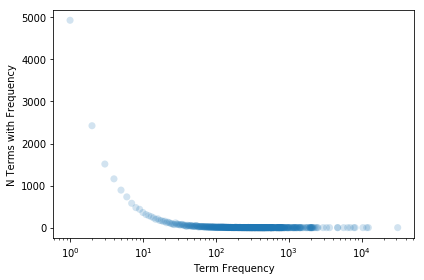

In [319]:
fig, ax_0 = plt.subplots(1, figsize=(6, 4))
ax_0.scatter(x_mesh_label_deduped_frequencies, y_mesh_label_deduped_frequency_counts,
           alpha=0.2, edgecolors='none', s=50)
ax_0.set_xscale('log')
ax_0.set_xlabel('Term Frequency')
ax_0.set_ylabel('N Terms with Frequency')

plt.tight_layout()

We can see that the distribution of term frequencies follows a power law. There are almost 5000 terms which occur only once, which accounts for over 25% of the labels used.

## 3. Local Outlier Detection

Local outlier detection measures the isolation of a sample with respect to the cluster of its nearest k neighbours. From the [scikit-learn](http://scikit-learn.org/stable/modules/generated/sklearn.neighbors.LocalOutlierFactor.html) website:

> The anomaly score of each sample is called Local Outlier Factor. It measures the local deviation of density of a given sample with respect to its neighbors. It is local in that the anomaly score depends on how isolated the object is with respect to the surrounding neighborhood. More precisely, locality is given by k-nearest neighbors, whose distance is used to estimate the local density. By comparing the local density of a sample to the local densities of its neighbors, one can identify samples that have a substantially lower density than their neighbors. These are considered outliers.

Here we will vectorise project descriptions into multi-dimensional space so that we can perform this algorithm upon them. This is essentially topic modelling followed by the outlier detection. Our hypothesis is that projects that fall within a topic, but mention terms that are not usually associated with other projects clustered in that topic area, will be picked up as local outliers. The result should be that innovations in which ideas are newly brought to an established context will be identified.

To assess how well this has worked, we will take three approaches:

- Compare the results from different vectorisation methods
- Analyse the outlier factors of the RWJF Pioneer projects in comparison to the other projects
- Manually compare projects with high local outlier factors to other projects in their nearest neighbour cluster

### 3.1 Document Preparation

For this analysis, we will use the deduplicated label representations of the projects. This is because we care whether a document mentions a concept at all, as opposed to "how much" a document is about a given subject.

To prepare the documents, we will

- eliminate labels that only appear once in the corpus
- manually eliminate some of the most frequently occuring labels
- convert to a format suitable for topic modelling
- (normalise the text)

In [291]:
# most infrequent
description_mesh_labels_deduped_lof = [[l for l in dmld if mesh_label_deduped_counts[l] > 1]
                                       for dmld in description_mesh_labels_deduped]

In [292]:
# removing a the top 3 words chosen manually
# 'Humans' is disproportionately represented
# 'Goals' and 'Animals' offer little semantic information in our context

removes = ['Humans', 'Goals', 'Students', 'Animals']

description_mesh_labels_deduped_lof = [[l for l in dmldl if l not in removes]
                                       for dmldl in description_mesh_labels_deduped_lof]

# removing docs that contain less than 5 labels
# get document lengths
description_mesh_labels_deduped_lengths = [len(l) for l in description_mesh_labels_deduped_lof]

In [394]:
gdb_df['description_mesh_labels_deduped_lengths'] = description_mesh_labels_deduped_lengths
gdb_df['description_mesh_labels_deduped_lof'] = description_mesh_labels_deduped_lof

In [408]:
lof_df = gdb_df[gdb_df['description_mesh_labels_deduped_lengths'] >= 5]

In [295]:
from gensim.corpora import Dictionary

In [296]:
description_mesh_label_deduped_dictionary = Dictionary(lof_df['description_mesh_labels_deduped_lof'].values)
description_mesh_label_deduped_corpus = [description_mesh_label_deduped_dictionary.doc2bow(d)
                                         for d in lof_df['description_mesh_labels_deduped_lof'].values]

### 3.2 LSI

The first method we are going to try for vectorisation in LSI due to its interpretability.

**Try again:**

Try with docs with min 5 terms.

Else try with the full documents (pre-processed with n-grams and/or noun chunks).
Remove any documents that are too short?

In [297]:
from gensim.models import TfidfModel
from gensim.models import LsiModel

In [298]:
tfidf = TfidfModel(corpus=description_mesh_label_deduped_corpus,
                   id2word=description_mesh_label_deduped_dictionary)
corpus_tfidf = tfidf[description_mesh_label_deduped_corpus]

lsi_model = LsiModel(corpus_tfidf,
                     id2word=description_mesh_label_deduped_dictionary,
                     num_topics=300)
corpus_lsi = lsi_model[corpus_tfidf]

In [299]:
from gensim.matutils import corpus2dense

In [300]:
matrix_lsi = corpus2dense(corpus_lsi, num_terms=300)
matrix_lsi = matrix_lsi.transpose()

In [301]:
from sklearn.neighbors import LocalOutlierFactor

In [302]:
lof = LocalOutlierFactor(n_jobs=3)

In [303]:
from sklearn.externals import joblib

In [304]:
lof_labels = lof.fit_predict(matrix_lsi)

In [305]:
lof_values = lof.negative_outlier_factor_

In [306]:
joblib.dump(lof, '../../../models/lof_lsi.pkl')

['../../../models/lof_lsi.pkl']

In [307]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE, Isomap

In [308]:
pca = PCA(n_components=50)

In [309]:
pca_lsi = pca.fit_transform(matrix_lsi)

In [310]:
tsne = TSNE()

In [311]:
tsne_lsi = tsne.fit_transform(pca_lsi)

In [416]:
lof_df['tsne_0'] = tsne_lsi[:, 0]
lof_df['tsne_1'] = tsne_lsi[:, 1]
lof_df['outlier_colour'] = ['red'  if l == -1 else 'blue' for l in lof_labels]
lof_df['outlier_values'] = lof_values
lof_df['outlier_values_log'] = np.log10(np.abs(lof_values))
lof_df['outlier_label'] = lof_labels

/Users/grichardson/miniconda3/envs/rwjf/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/Users/grichardson/miniconda3/envs/rwjf/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/grichardson/miniconda3/envs/rwjf/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

In [313]:
# tsne_df = lof_df[lof_df['outlier_values'] > -10]

In [330]:
cds = ColumnDataSource(lof_df[['tsne_0', 'tsne_1', 'outlier_colour', 'outlier_values', 'outlier_values_log']])

In [331]:
from bokeh.models import BoxZoomTool, ResetTool, WheelZoomTool, LinearColorMapper

In [332]:
color_mapper = LinearColorMapper(palette='Viridis256', low=tsne_df['outlier_values_log'].min(), high=tsne_df['outlier_values_log'].max())

hover = HoverTool(tooltips=[
    ("Description", "@descriptions"),
])
                                
box = BoxZoomTool()
reset = ResetTool()
zoom = WheelZoomTool()
# color_mapper = CategoricalColorMapper(factors=list(w2v_df['label'].values.unique()))

terms_tsne_scatter = figure(width=700, height=600, tools=[hover, box, reset, zoom],
                     title='TSNE Plot of Projects')
terms_tsne_scatter.circle(x='tsne_0', y='tsne_1', source=cds, alpha=0.2,
                          color='outlier_colour',
#                           color={'field': 'outlier_values_log', 'transform': color_mapper},
                          radius=0.2
                         )
terms_tsne_scatter.xgrid.visible = False
terms_tsne_scatter.ygrid.visible = False


show(terms_tsne_scatter)

In [417]:
lof_df['outlier_label'][lof_df['source_id'] == 'pioneers'].value_counts()

 1    73
-1    10
Name: outlier_label, dtype: int64

In [419]:
lof_df.reset_index(inplace=True)

In [371]:
import scipy

In [389]:
lof_kdtree = scipy.spatial.KDTree(matrix_lsi, leafsize=20)

Printing a random outlier and it's nearest neighbours in the topic model space, we can see that they often share one single topic. This highlights the very high term dispersity in the corpus.

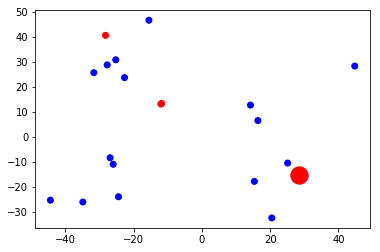

['Aged', 'Behavioral Medicine', 'Environment Design', 'Faculty', 'Female', 'Information Technology', 'Interdisciplinary Research', 'Mentoring', 'Pneumococcal Infections', 'Streptococcus pneumoniae', 'United States'] 

The goal of this Research Experiences for Undergraduates (REU) Site renewal is to offer a unique training opportunity for undergraduates to conduct research in the multidisciplinary area of smart environments, such as homes that are enhanced by information technology to meet residents' needs in a sophisticated and helpful manner.  The American population is aging; therefore research is needed to understand the effects of aging and to find ways of allowing older adults and individuals with disabilities to lead independent lives at home. This REU project facilitates research and training in the complementary disciplines of computer science, electrical engineering, psychology, and health care. Because some of the students will be living in apartments that also serve as test 

In [441]:
# get random outlier
outlier = lof_df[lof_df['outlier_label'] == -1].sample(1)
# get it's topic model vector
outlier_lsi_vector = matrix_lsi[outlier.index.values[0], :]
# find nearest neighbours
neighbour_closeness, neighbour_indices = lof_kdtree.query(outlier_lsi_vector, 20)

neighbours = lof_df.iloc[neighbour_indices[1:]]

fig, ax = plt.subplots(1, figsize=(6, 4))
ax.scatter(outlier['tsne_0'], outlier['tsne_1'], c=outlier['outlier_colour'], s=300)
ax.scatter(neighbours['tsne_0'], neighbours['tsne_1'], c=neighbours['outlier_colour'])
plt.show()

print(sorted(outlier['description_mesh_labels_deduped_lof'].values[0]), '\n')
print(outlier['description'].values[0], '\n')

for c, d, l in zip(neighbour_closeness, neighbours['description'].values, neighbours['description_mesh_labels_deduped_lof'].values):
    print('===============')
    print(c, '\n')
    print(sorted(l), '\n')
    print(d[:1000])